In [1]:
import time
from bs4 import BeautifulSoup
from top2vec import Top2Vec
import gensim
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from bertopic import BERTopic
from nltk.corpus import stopwords
import nltk
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
import re
import nltk
import json

In [2]:
def scrollPageAndGetSource(pageUrl):
    options = Options()
    options.headless = True
    options.add_argument('headless')
    options.add_argument("--window-size=1920,1080")
    driver = webdriver.Chrome(chrome_options=options)
    print(f"getting {pageUrl}")
    driver.get(pageUrl)
    last_height = driver.execute_script("return document.body.scrollHeight")
    SCROLL_PAUSE_TIME = 5
    print(f"Scrolling page {pageUrl}")
    while True:
        driver.find_element(By.TAG_NAME, "body").send_keys(Keys.PAGE_DOWN)
        time.sleep(SCROLL_PAUSE_TIME)

        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            break
        last_height = new_height
        print(f"Scrolling page {pageUrl}")
        
    print(f"Finished scrolling page {pageUrl}")
    return driver.page_source

In [3]:
def getContentFromPageSource(page_source):
    soup = BeautifulSoup(page_source, 'html.parser')
    return soup.text.strip()

In [4]:
def findAllInternalLinks(root, page_source):
    soup = BeautifulSoup(page_source, 'html.parser')
    a_tags = soup.findAll('a', href=True)
    internal_links: list[str] = []

    for link in a_tags:
        href = link['href']
        if not href.startswith(root):
            continue # skip external links
        internal_links.append(href)
    return internal_links

In [5]:
root = 'https://streekproduct.streekmarkt.be'
url = 'https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/'
all_content: list[str] = []

page_source = scrollPageAndGetSource(url)
content = getContentFromPageSource(page_source)
all_content.append(content)
internal_links = findAllInternalLinks(root, page_source)
unique_links = set(internal_links)
count = 0
for internal_link in unique_links:
    page_source = scrollPageAndGetSource(internal_link)
    content = getContentFromPageSource(page_source)
    all_content.append(content)
    count = count + 1
    print(f'{count}')

/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Finished scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/brouwerij-wilderen/
Scrolling page https://streekproduct.streekmarkt.be/brouwerij-wilderen/
Finished scrolling page https://streekproduct.streekmarkt.be/brouwerij-wilderen/
1


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/appelstrudel-met-eau-de-biere-van-wilderen/
Scrolling page https://streekproduct.streekmarkt.be/appelstrudel-met-eau-de-biere-van-wilderen/
Finished scrolling page https://streekproduct.streekmarkt.be/appelstrudel-met-eau-de-biere-van-wilderen/
2


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/zoete-aardappelchips/
Scrolling page https://streekproduct.streekmarkt.be/zoete-aardappelchips/
Finished scrolling page https://streekproduct.streekmarkt.be/zoete-aardappelchips/
3


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/kaas-en-bier-pairing/
Scrolling page https://streekproduct.streekmarkt.be/kaas-en-bier-pairing/
Finished scrolling page https://streekproduct.streekmarkt.be/kaas-en-bier-pairing/
4


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/winterse-gezelligheid-met-deze-zalige-elixir-d-anvers-cocktail/
Scrolling page https://streekproduct.streekmarkt.be/winterse-gezelligheid-met-deze-zalige-elixir-d-anvers-cocktail/
Finished scrolling page https://streekproduct.streekmarkt.be/winterse-gezelligheid-met-deze-zalige-elixir-d-anvers-cocktail/
5


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/cuberdon/
Scrolling page https://streekproduct.streekmarkt.be/category/cuberdon/
Finished scrolling page https://streekproduct.streekmarkt.be/category/cuberdon/
6


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/elixir-danvers/
Scrolling page https://streekproduct.streekmarkt.be/elixir-danvers/
Finished scrolling page https://streekproduct.streekmarkt.be/elixir-danvers/
7


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/chocoladesalon-van-brussel-2019/
Scrolling page https://streekproduct.streekmarkt.be/chocoladesalon-van-brussel-2019/
Finished scrolling page https://streekproduct.streekmarkt.be/chocoladesalon-van-brussel-2019/
8


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/antwerpen/
Scrolling page https://streekproduct.streekmarkt.be/category/antwerpen/
Scrolling page https://streekproduct.streekmarkt.be/category/antwerpen/
Finished scrolling page https://streekproduct.streekmarkt.be/category/antwerpen/
9


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/congolaiskes-chocolade-ruitjes-vol-nostalgie/
Scrolling page https://streekproduct.streekmarkt.be/congolaiskes-chocolade-ruitjes-vol-nostalgie/
Finished scrolling page https://streekproduct.streekmarkt.be/congolaiskes-chocolade-ruitjes-vol-nostalgie/
10


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/nieuws/
Scrolling page https://streekproduct.streekmarkt.be/category/nieuws/
Finished scrolling page https://streekproduct.streekmarkt.be/category/nieuws/
11


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/restaurants/
Scrolling page https://streekproduct.streekmarkt.be/category/restaurants/
Finished scrolling page https://streekproduct.streekmarkt.be/category/restaurants/
12


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/pomona-stroop-online-bestellen/
Scrolling page https://streekproduct.streekmarkt.be/pomona-stroop-online-bestellen/
Finished scrolling page https://streekproduct.streekmarkt.be/pomona-stroop-online-bestellen/
13


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gulle-handjes-resultaten/
Scrolling page https://streekproduct.streekmarkt.be/gulle-handjes-resultaten/
Finished scrolling page https://streekproduct.streekmarkt.be/gulle-handjes-resultaten/
14


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/filet-danvers/
Scrolling page https://streekproduct.streekmarkt.be/filet-danvers/
Finished scrolling page https://streekproduct.streekmarkt.be/filet-danvers/
15


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/asperges-meulenhuys/
Scrolling page https://streekproduct.streekmarkt.be/asperges-meulenhuys/
Scrolling page https://streekproduct.streekmarkt.be/asperges-meulenhuys/
Finished scrolling page https://streekproduct.streekmarkt.be/asperges-meulenhuys/
16


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/honing-en-kaneel-een-gezond-wondermiddel/
Scrolling page https://streekproduct.streekmarkt.be/honing-en-kaneel-een-gezond-wondermiddel/
Finished scrolling page https://streekproduct.streekmarkt.be/honing-en-kaneel-een-gezond-wondermiddel/
17


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/holy-water-cuberdon-gin-getest/
Scrolling page https://streekproduct.streekmarkt.be/holy-water-cuberdon-gin-getest/
Finished scrolling page https://streekproduct.streekmarkt.be/holy-water-cuberdon-gin-getest/
18


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/roze-ruby-chocolade-van-callebaut/
Scrolling page https://streekproduct.streekmarkt.be/roze-ruby-chocolade-van-callebaut/
Scrolling page https://streekproduct.streekmarkt.be/roze-ruby-chocolade-van-callebaut/
Finished scrolling page https://streekproduct.streekmarkt.be/roze-ruby-chocolade-van-callebaut/
19


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/hibiscus/
Scrolling page https://streekproduct.streekmarkt.be/hibiscus/
Scrolling page https://streekproduct.streekmarkt.be/hibiscus/
Finished scrolling page https://streekproduct.streekmarkt.be/hibiscus/
20


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/gentse-waterzooi-artikelen/
Scrolling page https://streekproduct.streekmarkt.be/category/gentse-waterzooi-artikelen/
Finished scrolling page https://streekproduct.streekmarkt.be/category/gentse-waterzooi-artikelen/
21


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/kaastaart-met-cuberdon/
Scrolling page https://streekproduct.streekmarkt.be/kaastaart-met-cuberdon/
Finished scrolling page https://streekproduct.streekmarkt.be/kaastaart-met-cuberdon/
22


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/blauwe-bessen/
Scrolling page https://streekproduct.streekmarkt.be/category/blauwe-bessen/
Finished scrolling page https://streekproduct.streekmarkt.be/category/blauwe-bessen/
23


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/antwerpen-proeft-12de-editie-culinaire-festival/
Scrolling page https://streekproduct.streekmarkt.be/antwerpen-proeft-12de-editie-culinaire-festival/
Finished scrolling page https://streekproduct.streekmarkt.be/antwerpen-proeft-12de-editie-culinaire-festival/
24


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/warm-op-voor-de-feestdagen-met-een-lekkere-jenever/
Scrolling page https://streekproduct.streekmarkt.be/warm-op-voor-de-feestdagen-met-een-lekkere-jenever/
Scrolling page https://streekproduct.streekmarkt.be/warm-op-voor-de-feestdagen-met-een-lekkere-jenever/
Finished scrolling page https://streekproduct.streekmarkt.be/warm-op-voor-de-feestdagen-met-een-lekkere-jenever/
25


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/blauwe-bessen-gezonde-lekkernij/
Scrolling page https://streekproduct.streekmarkt.be/blauwe-bessen-gezonde-lekkernij/
Finished scrolling page https://streekproduct.streekmarkt.be/blauwe-bessen-gezonde-lekkernij/
26


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/aardbei/
Scrolling page https://streekproduct.streekmarkt.be/category/aardbei/
Finished scrolling page https://streekproduct.streekmarkt.be/category/aardbei/
27


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/balkenbrij/
Scrolling page https://streekproduct.streekmarkt.be/balkenbrij/
Finished scrolling page https://streekproduct.streekmarkt.be/balkenbrij/
28


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/stroop/
Scrolling page https://streekproduct.streekmarkt.be/category/stroop/
Finished scrolling page https://streekproduct.streekmarkt.be/category/stroop/
29


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/chocolade/
Scrolling page https://streekproduct.streekmarkt.be/category/chocolade/
Scrolling page https://streekproduct.streekmarkt.be/category/chocolade/
Finished scrolling page https://streekproduct.streekmarkt.be/category/chocolade/
30


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/klassieke-chocoladetaart-recept/
Scrolling page https://streekproduct.streekmarkt.be/klassieke-chocoladetaart-recept/
Finished scrolling page https://streekproduct.streekmarkt.be/klassieke-chocoladetaart-recept/
31


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/amandel-banaan-pannenkoekjes-recept/
Scrolling page https://streekproduct.streekmarkt.be/amandel-banaan-pannenkoekjes-recept/
Finished scrolling page https://streekproduct.streekmarkt.be/amandel-banaan-pannenkoekjes-recept/
32


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gentse-waterzooi-typisch-gents-gerecht/
Scrolling page https://streekproduct.streekmarkt.be/gentse-waterzooi-typisch-gents-gerecht/
Scrolling page https://streekproduct.streekmarkt.be/gentse-waterzooi-typisch-gents-gerecht/
Finished scrolling page https://streekproduct.streekmarkt.be/gentse-waterzooi-typisch-gents-gerecht/
33


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/smaakpakket-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/smaakpakket-belgische-streekproducten/
Finished scrolling page https://streekproduct.streekmarkt.be/smaakpakket-belgische-streekproducten/
34


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/thee-met-een-verhaal/
Scrolling page https://streekproduct.streekmarkt.be/thee-met-een-verhaal/
Finished scrolling page https://streekproduct.streekmarkt.be/thee-met-een-verhaal/
35


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gezonde-eucalyptus/
Scrolling page https://streekproduct.streekmarkt.be/gezonde-eucalyptus/
Scrolling page https://streekproduct.streekmarkt.be/gezonde-eucalyptus/
Finished scrolling page https://streekproduct.streekmarkt.be/gezonde-eucalyptus/
36


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/kazen/
Scrolling page https://streekproduct.streekmarkt.be/category/kazen/
Finished scrolling page https://streekproduct.streekmarkt.be/category/kazen/
37


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/gin/
Scrolling page https://streekproduct.streekmarkt.be/category/gin/
Finished scrolling page https://streekproduct.streekmarkt.be/category/gin/
38


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/4-dingen-over-breydel-die-je-nog-niet-wist/
Scrolling page https://streekproduct.streekmarkt.be/4-dingen-over-breydel-die-je-nog-niet-wist/
Finished scrolling page https://streekproduct.streekmarkt.be/4-dingen-over-breydel-die-je-nog-niet-wist/
39


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/west-vlaanderen/
Scrolling page https://streekproduct.streekmarkt.be/category/west-vlaanderen/
Finished scrolling page https://streekproduct.streekmarkt.be/category/west-vlaanderen/
40


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/geschenken/
Scrolling page https://streekproduct.streekmarkt.be/category/geschenken/
Finished scrolling page https://streekproduct.streekmarkt.be/category/geschenken/
41


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/belgische-wafels/
Scrolling page https://streekproduct.streekmarkt.be/category/belgische-wafels/
Finished scrolling page https://streekproduct.streekmarkt.be/category/belgische-wafels/
42


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/vanillewafeltjes-met-aardbeien-van-hoogstraten/
Scrolling page https://streekproduct.streekmarkt.be/vanillewafeltjes-met-aardbeien-van-hoogstraten/
Scrolling page https://streekproduct.streekmarkt.be/vanillewafeltjes-met-aardbeien-van-hoogstraten/
Finished scrolling page https://streekproduct.streekmarkt.be/vanillewafeltjes-met-aardbeien-van-hoogstraten/
43


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/visrestaurant-brussel/
Scrolling page https://streekproduct.streekmarkt.be/visrestaurant-brussel/
Finished scrolling page https://streekproduct.streekmarkt.be/visrestaurant-brussel/
44


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/kerstgeschenken-2018-online-bestellen-en-laten-leveren/
Scrolling page https://streekproduct.streekmarkt.be/kerstgeschenken-2018-online-bestellen-en-laten-leveren/
Finished scrolling page https://streekproduct.streekmarkt.be/kerstgeschenken-2018-online-bestellen-en-laten-leveren/
45


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/suikervrij-eten/
Scrolling page https://streekproduct.streekmarkt.be/suikervrij-eten/
Finished scrolling page https://streekproduct.streekmarkt.be/suikervrij-eten/
46


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/win/
Scrolling page https://streekproduct.streekmarkt.be/win/
Finished scrolling page https://streekproduct.streekmarkt.be/win/
47


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/
Scrolling page https://streekproduct.streekmarkt.be/
Finished scrolling page https://streekproduct.streekmarkt.be/
48


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/kazen-en-glazen/
Scrolling page https://streekproduct.streekmarkt.be/kazen-en-glazen/
Finished scrolling page https://streekproduct.streekmarkt.be/kazen-en-glazen/
49


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/maaslandse-boerenhesp/
Scrolling page https://streekproduct.streekmarkt.be/maaslandse-boerenhesp/
Finished scrolling page https://streekproduct.streekmarkt.be/maaslandse-boerenhesp/
50


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/cuberdon-of-gentse-neus/
Scrolling page https://streekproduct.streekmarkt.be/cuberdon-of-gentse-neus/
Finished scrolling page https://streekproduct.streekmarkt.be/cuberdon-of-gentse-neus/
51


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/ham/
Scrolling page https://streekproduct.streekmarkt.be/category/ham/
Finished scrolling page https://streekproduct.streekmarkt.be/category/ham/
52


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/picnic/
Scrolling page https://streekproduct.streekmarkt.be/category/picnic/
Finished scrolling page https://streekproduct.streekmarkt.be/category/picnic/
53


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/belgische-speculaas/
Scrolling page https://streekproduct.streekmarkt.be/category/belgische-speculaas/
Finished scrolling page https://streekproduct.streekmarkt.be/category/belgische-speculaas/
54


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/vleeswaren/
Scrolling page https://streekproduct.streekmarkt.be/category/vleeswaren/
Finished scrolling page https://streekproduct.streekmarkt.be/category/vleeswaren/
55


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/blauwe-bessen/
Scrolling page https://streekproduct.streekmarkt.be/blauwe-bessen/
Finished scrolling page https://streekproduct.streekmarkt.be/blauwe-bessen/
56


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/zijn-kerstgeschenken-aan-klanten-en-personeel-aftrekbaar/
Scrolling page https://streekproduct.streekmarkt.be/zijn-kerstgeschenken-aan-klanten-en-personeel-aftrekbaar/
Finished scrolling page https://streekproduct.streekmarkt.be/zijn-kerstgeschenken-aan-klanten-en-personeel-aftrekbaar/
57


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/belgische-speculaas/
Scrolling page https://streekproduct.streekmarkt.be/belgische-speculaas/
Finished scrolling page https://streekproduct.streekmarkt.be/belgische-speculaas/
58


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/belgische-chocolade-weetjes/
Scrolling page https://streekproduct.streekmarkt.be/belgische-chocolade-weetjes/
Finished scrolling page https://streekproduct.streekmarkt.be/belgische-chocolade-weetjes/
59


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/achelse-blauwe/
Scrolling page https://streekproduct.streekmarkt.be/achelse-blauwe/
Finished scrolling page https://streekproduct.streekmarkt.be/achelse-blauwe/
60


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gentse-mosterd/
Scrolling page https://streekproduct.streekmarkt.be/gentse-mosterd/
Finished scrolling page https://streekproduct.streekmarkt.be/gentse-mosterd/
61


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/pomona-gezonde-stroop-met-appels-en-suikerbiet/
Scrolling page https://streekproduct.streekmarkt.be/pomona-gezonde-stroop-met-appels-en-suikerbiet/
Finished scrolling page https://streekproduct.streekmarkt.be/pomona-gezonde-stroop-met-appels-en-suikerbiet/
62


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/recepten/
Scrolling page https://streekproduct.streekmarkt.be/category/recepten/
Scrolling page https://streekproduct.streekmarkt.be/category/recepten/
Finished scrolling page https://streekproduct.streekmarkt.be/category/recepten/
63


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/geheimen-uit-de-bierkelder/
Scrolling page https://streekproduct.streekmarkt.be/geheimen-uit-de-bierkelder/
Scrolling page https://streekproduct.streekmarkt.be/geheimen-uit-de-bierkelder/
Finished scrolling page https://streekproduct.streekmarkt.be/geheimen-uit-de-bierkelder/
64


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/waarom-krijgen-we-kerstgeschenken/
Scrolling page https://streekproduct.streekmarkt.be/waarom-krijgen-we-kerstgeschenken/
Finished scrolling page https://streekproduct.streekmarkt.be/waarom-krijgen-we-kerstgeschenken/
65


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/kaneel-kanjer-in-de-keuken/
Scrolling page https://streekproduct.streekmarkt.be/kaneel-kanjer-in-de-keuken/
Scrolling page https://streekproduct.streekmarkt.be/kaneel-kanjer-in-de-keuken/
Finished scrolling page https://streekproduct.streekmarkt.be/kaneel-kanjer-in-de-keuken/
66


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/chocolademelk-is-goed-voor-je-gezondhied/
Scrolling page https://streekproduct.streekmarkt.be/chocolademelk-is-goed-voor-je-gezondhied/
Finished scrolling page https://streekproduct.streekmarkt.be/chocolademelk-is-goed-voor-je-gezondhied/
67


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/waterkers-van-sint-lucie/
Scrolling page https://streekproduct.streekmarkt.be/waterkers-van-sint-lucie/
Finished scrolling page https://streekproduct.streekmarkt.be/waterkers-van-sint-lucie/
68


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/biertrends-voor-de-zomer/
Scrolling page https://streekproduct.streekmarkt.be/biertrends-voor-de-zomer/
Finished scrolling page https://streekproduct.streekmarkt.be/biertrends-voor-de-zomer/
69


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/stroop-van-vrolingen-blijft-bestaan/
Scrolling page https://streekproduct.streekmarkt.be/stroop-van-vrolingen-blijft-bestaan/
Finished scrolling page https://streekproduct.streekmarkt.be/stroop-van-vrolingen-blijft-bestaan/
70


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/toast-met-appelpate/
Scrolling page https://streekproduct.streekmarkt.be/toast-met-appelpate/
Finished scrolling page https://streekproduct.streekmarkt.be/toast-met-appelpate/
71


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/babbu-kan-wel-eens-het-drankje-van-de-zomer-worden-geproefd/
Scrolling page https://streekproduct.streekmarkt.be/babbu-kan-wel-eens-het-drankje-van-de-zomer-worden-geproefd/
Finished scrolling page https://streekproduct.streekmarkt.be/babbu-kan-wel-eens-het-drankje-van-de-zomer-worden-geproefd/
72


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/belgisch-bier/
Scrolling page https://streekproduct.streekmarkt.be/category/belgisch-bier/
Finished scrolling page https://streekproduct.streekmarkt.be/category/belgisch-bier/
73


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/culinair-festival-antwerpen-proeft/
Scrolling page https://streekproduct.streekmarkt.be/culinair-festival-antwerpen-proeft/
Finished scrolling page https://streekproduct.streekmarkt.be/culinair-festival-antwerpen-proeft/
74


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/hoe-maak-je-een-goede-gin-tonic/
Scrolling page https://streekproduct.streekmarkt.be/hoe-maak-je-een-goede-gin-tonic/
Finished scrolling page https://streekproduct.streekmarkt.be/hoe-maak-je-een-goede-gin-tonic/
75


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/7-gezondheidsvoordelen-van-honing/
Scrolling page https://streekproduct.streekmarkt.be/7-gezondheidsvoordelen-van-honing/
Scrolling page https://streekproduct.streekmarkt.be/7-gezondheidsvoordelen-van-honing/
Finished scrolling page https://streekproduct.streekmarkt.be/7-gezondheidsvoordelen-van-honing/
76


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/hoeveel-koffie-mag-je-nu-eigenlijk-per-dag-drinken/
Scrolling page https://streekproduct.streekmarkt.be/hoeveel-koffie-mag-je-nu-eigenlijk-per-dag-drinken/
Scrolling page https://streekproduct.streekmarkt.be/hoeveel-koffie-mag-je-nu-eigenlijk-per-dag-drinken/
Finished scrolling page https://streekproduct.streekmarkt.be/hoeveel-koffie-mag-je-nu-eigenlijk-per-dag-drinken/
77


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/honing/
Scrolling page https://streekproduct.streekmarkt.be/category/honing/
Finished scrolling page https://streekproduct.streekmarkt.be/category/honing/
78


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/welke-tonic-bij-welke-gin/
Scrolling page https://streekproduct.streekmarkt.be/welke-tonic-bij-welke-gin/
Scrolling page https://streekproduct.streekmarkt.be/welke-tonic-bij-welke-gin/
Finished scrolling page https://streekproduct.streekmarkt.be/welke-tonic-bij-welke-gin/
79


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/blauwe-bessen-plukken-bij-blueberry-fields-2019/
Scrolling page https://streekproduct.streekmarkt.be/blauwe-bessen-plukken-bij-blueberry-fields-2019/
Scrolling page https://streekproduct.streekmarkt.be/blauwe-bessen-plukken-bij-blueberry-fields-2019/
Finished scrolling page https://streekproduct.streekmarkt.be/blauwe-bessen-plukken-bij-blueberry-fields-2019/
80


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/authentieke-boekweitpannenkoek-met-stroop/
Scrolling page https://streekproduct.streekmarkt.be/authentieke-boekweitpannenkoek-met-stroop/
Finished scrolling page https://streekproduct.streekmarkt.be/authentieke-boekweitpannenkoek-met-stroop/
81


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/aardbeien-van-hoogstraten/
Scrolling page https://streekproduct.streekmarkt.be/aardbeien-van-hoogstraten/
Finished scrolling page https://streekproduct.streekmarkt.be/aardbeien-van-hoogstraten/
82


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/kaastips-van-de-kaasmeester/
Scrolling page https://streekproduct.streekmarkt.be/kaastips-van-de-kaasmeester/
Finished scrolling page https://streekproduct.streekmarkt.be/kaastips-van-de-kaasmeester/
83


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/wat-is-nougat-vital/
Scrolling page https://streekproduct.streekmarkt.be/wat-is-nougat-vital/
Scrolling page https://streekproduct.streekmarkt.be/wat-is-nougat-vital/
Finished scrolling page https://streekproduct.streekmarkt.be/wat-is-nougat-vital/
84


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/een-foodtruck-op-je-feestje-hip-en-heerlijk/
Scrolling page https://streekproduct.streekmarkt.be/een-foodtruck-op-je-feestje-hip-en-heerlijk/
Finished scrolling page https://streekproduct.streekmarkt.be/een-foodtruck-op-je-feestje-hip-en-heerlijk/
85


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/macaron/
Scrolling page https://streekproduct.streekmarkt.be/macaron/
Finished scrolling page https://streekproduct.streekmarkt.be/macaron/
86


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/gember/
Scrolling page https://streekproduct.streekmarkt.be/category/gember/
Finished scrolling page https://streekproduct.streekmarkt.be/category/gember/
87


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/kazen-van-bij-ons/
Scrolling page https://streekproduct.streekmarkt.be/kazen-van-bij-ons/
Finished scrolling page https://streekproduct.streekmarkt.be/kazen-van-bij-ons/
88


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/herbekijk-de-modeshow-met-jurken-in-chocolade-van-het-chocoladesalon-2019/
Scrolling page https://streekproduct.streekmarkt.be/herbekijk-de-modeshow-met-jurken-in-chocolade-van-het-chocoladesalon-2019/
Finished scrolling page https://streekproduct.streekmarkt.be/herbekijk-de-modeshow-met-jurken-in-chocolade-van-het-chocoladesalon-2019/
89


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/boekweitmeel-vant-gebroek/
Scrolling page https://streekproduct.streekmarkt.be/boekweitmeel-vant-gebroek/
Finished scrolling page https://streekproduct.streekmarkt.be/boekweitmeel-vant-gebroek/
90


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/23-redenen-om-meer-citroen-te-eten/
Scrolling page https://streekproduct.streekmarkt.be/23-redenen-om-meer-citroen-te-eten/
Finished scrolling page https://streekproduct.streekmarkt.be/23-redenen-om-meer-citroen-te-eten/
91


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/pittige-mosterd-uit-haspengouw/
Scrolling page https://streekproduct.streekmarkt.be/pittige-mosterd-uit-haspengouw/
Finished scrolling page https://streekproduct.streekmarkt.be/pittige-mosterd-uit-haspengouw/
92


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/food-wood-pukkelpop-bij-ons-ma/
Scrolling page https://streekproduct.streekmarkt.be/food-wood-pukkelpop-bij-ons-ma/
Finished scrolling page https://streekproduct.streekmarkt.be/food-wood-pukkelpop-bij-ons-ma/
93


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/opgelegde-zure-haring/
Scrolling page https://streekproduct.streekmarkt.be/opgelegde-zure-haring/
Finished scrolling page https://streekproduct.streekmarkt.be/opgelegde-zure-haring/
94


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/de-echte-luikse-stroop/
Scrolling page https://streekproduct.streekmarkt.be/de-echte-luikse-stroop/
Finished scrolling page https://streekproduct.streekmarkt.be/de-echte-luikse-stroop/
95


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/chocoladesalon-salon-du-chocolat-2020-was-weer-een-top-editie/
Scrolling page https://streekproduct.streekmarkt.be/chocoladesalon-salon-du-chocolat-2020-was-weer-een-top-editie/
Finished scrolling page https://streekproduct.streekmarkt.be/chocoladesalon-salon-du-chocolat-2020-was-weer-een-top-editie/
96


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/foodtruck/
Scrolling page https://streekproduct.streekmarkt.be/category/foodtruck/
Finished scrolling page https://streekproduct.streekmarkt.be/category/foodtruck/
97


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/geschenken/
Scrolling page https://streekproduct.streekmarkt.be/geschenken/
Finished scrolling page https://streekproduct.streekmarkt.be/geschenken/
98


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
Finished scrolling page https://streekproduct.streekmarkt.be/blog-belgische-streekproducten/
99


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/koffie/
Scrolling page https://streekproduct.streekmarkt.be/category/koffie/
Finished scrolling page https://streekproduct.streekmarkt.be/category/koffie/
100


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/nespresso-vertuo-grote-koffie-met-extra-crema/
Scrolling page https://streekproduct.streekmarkt.be/nespresso-vertuo-grote-koffie-met-extra-crema/
Finished scrolling page https://streekproduct.streekmarkt.be/nespresso-vertuo-grote-koffie-met-extra-crema/
101


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/drankje-met-opgeklopte-nutella-hit-op-sociale-media/
Scrolling page https://streekproduct.streekmarkt.be/drankje-met-opgeklopte-nutella-hit-op-sociale-media/
Finished scrolling page https://streekproduct.streekmarkt.be/drankje-met-opgeklopte-nutella-hit-op-sociale-media/
102


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/zoethout-veelzijdige-wortel/
Scrolling page https://streekproduct.streekmarkt.be/zoethout-veelzijdige-wortel/
Scrolling page https://streekproduct.streekmarkt.be/zoethout-veelzijdige-wortel/
Finished scrolling page https://streekproduct.streekmarkt.be/zoethout-veelzijdige-wortel/
103


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/volkorenpasta-met-spinazie-en-achelse-blauwe/
Scrolling page https://streekproduct.streekmarkt.be/volkorenpasta-met-spinazie-en-achelse-blauwe/
Finished scrolling page https://streekproduct.streekmarkt.be/volkorenpasta-met-spinazie-en-achelse-blauwe/
104


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/praline/
Scrolling page https://streekproduct.streekmarkt.be/praline/
Finished scrolling page https://streekproduct.streekmarkt.be/praline/
105


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/propolis/
Scrolling page https://streekproduct.streekmarkt.be/propolis/
Finished scrolling page https://streekproduct.streekmarkt.be/propolis/
106


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/relatiegeschenken/
Scrolling page https://streekproduct.streekmarkt.be/relatiegeschenken/
Finished scrolling page https://streekproduct.streekmarkt.be/relatiegeschenken/
107


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/amandelbrood-uit-veurne-recept/
Scrolling page https://streekproduct.streekmarkt.be/amandelbrood-uit-veurne-recept/
Finished scrolling page https://streekproduct.streekmarkt.be/amandelbrood-uit-veurne-recept/
108


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/hoe-drinkt-belgie-zijn-koffie-het-liefst-op-het-werk/
Scrolling page https://streekproduct.streekmarkt.be/hoe-drinkt-belgie-zijn-koffie-het-liefst-op-het-werk/
Finished scrolling page https://streekproduct.streekmarkt.be/hoe-drinkt-belgie-zijn-koffie-het-liefst-op-het-werk/
109


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/asperges-a-la-flamand-recept/
Scrolling page https://streekproduct.streekmarkt.be/asperges-a-la-flamand-recept/
Scrolling page https://streekproduct.streekmarkt.be/asperges-a-la-flamand-recept/
Finished scrolling page https://streekproduct.streekmarkt.be/asperges-a-la-flamand-recept/
110


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/limburg/
Scrolling page https://streekproduct.streekmarkt.be/category/limburg/
Scrolling page https://streekproduct.streekmarkt.be/category/limburg/
Finished scrolling page https://streekproduct.streekmarkt.be/category/limburg/
111


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/waarom-gin-tonic-zo-geweldig-is/
Scrolling page https://streekproduct.streekmarkt.be/waarom-gin-tonic-zo-geweldig-is/
Finished scrolling page https://streekproduct.streekmarkt.be/waarom-gin-tonic-zo-geweldig-is/
112


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/asperges/
Scrolling page https://streekproduct.streekmarkt.be/category/asperges/
Finished scrolling page https://streekproduct.streekmarkt.be/category/asperges/
113


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/vlierbloesemsiroop/
Scrolling page https://streekproduct.streekmarkt.be/vlierbloesemsiroop/
Finished scrolling page https://streekproduct.streekmarkt.be/vlierbloesemsiroop/
114


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gentse-waterzooi-van-kip/
Scrolling page https://streekproduct.streekmarkt.be/gentse-waterzooi-van-kip/
Finished scrolling page https://streekproduct.streekmarkt.be/gentse-waterzooi-van-kip/
115


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/perrette-chocolade-geproefd/
Scrolling page https://streekproduct.streekmarkt.be/perrette-chocolade-geproefd/
Finished scrolling page https://streekproduct.streekmarkt.be/perrette-chocolade-geproefd/
116


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/sergio-herman-tilt-de-belgische-frieten-naar-een-hoger-niveau/
Scrolling page https://streekproduct.streekmarkt.be/sergio-herman-tilt-de-belgische-frieten-naar-een-hoger-niveau/
Finished scrolling page https://streekproduct.streekmarkt.be/sergio-herman-tilt-de-belgische-frieten-naar-een-hoger-niveau/
117


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/wijn/
Scrolling page https://streekproduct.streekmarkt.be/category/wijn/
Finished scrolling page https://streekproduct.streekmarkt.be/category/wijn/
118


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/proeverij/
Scrolling page https://streekproduct.streekmarkt.be/category/proeverij/
Finished scrolling page https://streekproduct.streekmarkt.be/category/proeverij/
119


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/mikkemannen-zoete-broodjes-uit-limburg/
Scrolling page https://streekproduct.streekmarkt.be/mikkemannen-zoete-broodjes-uit-limburg/
Scrolling page https://streekproduct.streekmarkt.be/mikkemannen-zoete-broodjes-uit-limburg/
Finished scrolling page https://streekproduct.streekmarkt.be/mikkemannen-zoete-broodjes-uit-limburg/
120


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/haringhapje/
Scrolling page https://streekproduct.streekmarkt.be/haringhapje/
Finished scrolling page https://streekproduct.streekmarkt.be/haringhapje/
121


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/nutty-thins/
Scrolling page https://streekproduct.streekmarkt.be/nutty-thins/
Finished scrolling page https://streekproduct.streekmarkt.be/nutty-thins/
122


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/koffie-ijskoud-hartverwarmend/
Scrolling page https://streekproduct.streekmarkt.be/koffie-ijskoud-hartverwarmend/
Scrolling page https://streekproduct.streekmarkt.be/koffie-ijskoud-hartverwarmend/
Finished scrolling page https://streekproduct.streekmarkt.be/koffie-ijskoud-hartverwarmend/
123


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/belgische-chocolade-bijzonder/
Scrolling page https://streekproduct.streekmarkt.be/belgische-chocolade-bijzonder/
Finished scrolling page https://streekproduct.streekmarkt.be/belgische-chocolade-bijzonder/
124


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/wijnkasteel-genoels-elderen/
Scrolling page https://streekproduct.streekmarkt.be/wijnkasteel-genoels-elderen/
Finished scrolling page https://streekproduct.streekmarkt.be/wijnkasteel-genoels-elderen/
125


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/chocoladetaart-100-belgisch/
Scrolling page https://streekproduct.streekmarkt.be/chocoladetaart-100-belgisch/
Finished scrolling page https://streekproduct.streekmarkt.be/chocoladetaart-100-belgisch/
126


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/oesters-met-gin-recept/
Scrolling page https://streekproduct.streekmarkt.be/oesters-met-gin-recept/
Finished scrolling page https://streekproduct.streekmarkt.be/oesters-met-gin-recept/
127


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/ontdek-onze-topaanbieding-tijdens-the-lazy-sundays/
Scrolling page https://streekproduct.streekmarkt.be/ontdek-onze-topaanbieding-tijdens-the-lazy-sundays/
Finished scrolling page https://streekproduct.streekmarkt.be/ontdek-onze-topaanbieding-tijdens-the-lazy-sundays/
128


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/vlieronade-het-zomerdrankje-dat-je-moet-proeven/
Scrolling page https://streekproduct.streekmarkt.be/vlieronade-het-zomerdrankje-dat-je-moet-proeven/
Scrolling page https://streekproduct.streekmarkt.be/vlieronade-het-zomerdrankje-dat-je-moet-proeven/
Finished scrolling page https://streekproduct.streekmarkt.be/vlieronade-het-zomerdrankje-dat-je-moet-proeven/
129


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/streekbier/
Scrolling page https://streekproduct.streekmarkt.be/category/streekbier/
Finished scrolling page https://streekproduct.streekmarkt.be/category/streekbier/
130


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/foodevents/
Scrolling page https://streekproduct.streekmarkt.be/category/foodevents/
Finished scrolling page https://streekproduct.streekmarkt.be/category/foodevents/
131


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/knapkoek-uit-het-maasland/
Scrolling page https://streekproduct.streekmarkt.be/knapkoek-uit-het-maasland/
Finished scrolling page https://streekproduct.streekmarkt.be/knapkoek-uit-het-maasland/
132


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/oost-vlaanderen/
Scrolling page https://streekproduct.streekmarkt.be/category/oost-vlaanderen/
Finished scrolling page https://streekproduct.streekmarkt.be/category/oost-vlaanderen/
133


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/granola/
Scrolling page https://streekproduct.streekmarkt.be/granola/
Finished scrolling page https://streekproduct.streekmarkt.be/granola/
134


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/chocolatier-boon-is-ambachtelijke-ondernemer-van-het-jaar/
Scrolling page https://streekproduct.streekmarkt.be/chocolatier-boon-is-ambachtelijke-ondernemer-van-het-jaar/
Finished scrolling page https://streekproduct.streekmarkt.be/chocolatier-boon-is-ambachtelijke-ondernemer-van-het-jaar/
135


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/molse-kipkap-2/
Scrolling page https://streekproduct.streekmarkt.be/molse-kipkap-2/
Scrolling page https://streekproduct.streekmarkt.be/molse-kipkap-2/
Finished scrolling page https://streekproduct.streekmarkt.be/molse-kipkap-2/
136


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/food-festivals/
Scrolling page https://streekproduct.streekmarkt.be/category/food-festivals/
Finished scrolling page https://streekproduct.streekmarkt.be/category/food-festivals/
137


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/vlierbloesem/
Scrolling page https://streekproduct.streekmarkt.be/category/vlierbloesem/
Finished scrolling page https://streekproduct.streekmarkt.be/category/vlierbloesem/
138


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/heerlijke-proeverijdagen-op-het-wijnkasteel-van-genoels-elderen/
Scrolling page https://streekproduct.streekmarkt.be/heerlijke-proeverijdagen-op-het-wijnkasteel-van-genoels-elderen/
Finished scrolling page https://streekproduct.streekmarkt.be/heerlijke-proeverijdagen-op-het-wijnkasteel-van-genoels-elderen/
139


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/vrijmoed-gin-jenever/
Scrolling page https://streekproduct.streekmarkt.be/vrijmoed-gin-jenever/
Finished scrolling page https://streekproduct.streekmarkt.be/vrijmoed-gin-jenever/
140


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/marbi-ambachtelijk-chocopasta-met-een-knapperig-laagje-pure-chocola/
Scrolling page https://streekproduct.streekmarkt.be/marbi-ambachtelijk-chocopasta-met-een-knapperig-laagje-pure-chocola/
Scrolling page https://streekproduct.streekmarkt.be/marbi-ambachtelijk-chocopasta-met-een-knapperig-laagje-pure-chocola/
Finished scrolling page https://streekproduct.streekmarkt.be/marbi-ambachtelijk-chocopasta-met-een-knapperig-laagje-pure-chocola/
141


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/spareribs-met-luikse-stroop/
Scrolling page https://streekproduct.streekmarkt.be/spareribs-met-luikse-stroop/
Finished scrolling page https://streekproduct.streekmarkt.be/spareribs-met-luikse-stroop/
142


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/eau-de-biere-van-wilderen/
Scrolling page https://streekproduct.streekmarkt.be/eau-de-biere-van-wilderen/
Finished scrolling page https://streekproduct.streekmarkt.be/eau-de-biere-van-wilderen/
143


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/jules-destrooper-lukken-smaken-al-130-jaar-lang/
Scrolling page https://streekproduct.streekmarkt.be/jules-destrooper-lukken-smaken-al-130-jaar-lang/
Finished scrolling page https://streekproduct.streekmarkt.be/jules-destrooper-lukken-smaken-al-130-jaar-lang/
144


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/top-5-leukste-picknickplekjes-in-belgie/
Scrolling page https://streekproduct.streekmarkt.be/top-5-leukste-picknickplekjes-in-belgie/
Scrolling page https://streekproduct.streekmarkt.be/top-5-leukste-picknickplekjes-in-belgie/
Finished scrolling page https://streekproduct.streekmarkt.be/top-5-leukste-picknickplekjes-in-belgie/
145


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/asperges-op-zijn-vlaams/
Scrolling page https://streekproduct.streekmarkt.be/asperges-op-zijn-vlaams/
Finished scrolling page https://streekproduct.streekmarkt.be/asperges-op-zijn-vlaams/
146


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/videos/
Scrolling page https://streekproduct.streekmarkt.be/videos/
Finished scrolling page https://streekproduct.streekmarkt.be/videos/
147


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/zoete-aardbeienlasagne/
Scrolling page https://streekproduct.streekmarkt.be/zoete-aardbeienlasagne/
Finished scrolling page https://streekproduct.streekmarkt.be/zoete-aardbeienlasagne/
148


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/vismet-hoe-brussel-smaakt-als-saus/
Scrolling page https://streekproduct.streekmarkt.be/vismet-hoe-brussel-smaakt-als-saus/
Finished scrolling page https://streekproduct.streekmarkt.be/vismet-hoe-brussel-smaakt-als-saus/
149


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gimber-een-pittige-drank-zonder-alcohol/
Scrolling page https://streekproduct.streekmarkt.be/gimber-een-pittige-drank-zonder-alcohol/
Finished scrolling page https://streekproduct.streekmarkt.be/gimber-een-pittige-drank-zonder-alcohol/
150


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/double-you-gin-puur-genieten/
Scrolling page https://streekproduct.streekmarkt.be/double-you-gin-puur-genieten/
Finished scrolling page https://streekproduct.streekmarkt.be/double-you-gin-puur-genieten/
151


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/aardbeien-gezond-en-lekker/
Scrolling page https://streekproduct.streekmarkt.be/aardbeien-gezond-en-lekker/
Finished scrolling page https://streekproduct.streekmarkt.be/aardbeien-gezond-en-lekker/
152


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/courgettesoep-met-waterkers-van-sint-luice/
Scrolling page https://streekproduct.streekmarkt.be/courgettesoep-met-waterkers-van-sint-luice/
Finished scrolling page https://streekproduct.streekmarkt.be/courgettesoep-met-waterkers-van-sint-luice/
153


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/picknick/
Scrolling page https://streekproduct.streekmarkt.be/category/picknick/
Finished scrolling page https://streekproduct.streekmarkt.be/category/picknick/
154


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/kaneel/
Scrolling page https://streekproduct.streekmarkt.be/category/kaneel/
Finished scrolling page https://streekproduct.streekmarkt.be/category/kaneel/
155


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/waterzooi-van-kip-recept/
Scrolling page https://streekproduct.streekmarkt.be/waterzooi-van-kip-recept/
Scrolling page https://streekproduct.streekmarkt.be/waterzooi-van-kip-recept/
Finished scrolling page https://streekproduct.streekmarkt.be/waterzooi-van-kip-recept/
156


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/belgische-wafels/
Scrolling page https://streekproduct.streekmarkt.be/belgische-wafels/
Finished scrolling page https://streekproduct.streekmarkt.be/belgische-wafels/
157


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gezond-ontbijt/
Scrolling page https://streekproduct.streekmarkt.be/gezond-ontbijt/
Scrolling page https://streekproduct.streekmarkt.be/gezond-ontbijt/
Finished scrolling page https://streekproduct.streekmarkt.be/gezond-ontbijt/
158


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/winefair-2019-vernieuwt-en-verhuist-naar-thor-central-in-genk/
Scrolling page https://streekproduct.streekmarkt.be/winefair-2019-vernieuwt-en-verhuist-naar-thor-central-in-genk/
Finished scrolling page https://streekproduct.streekmarkt.be/winefair-2019-vernieuwt-en-verhuist-naar-thor-central-in-genk/
159


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/likoke-on-tour-aan-het-waterfront-geproefd/
Scrolling page https://streekproduct.streekmarkt.be/likoke-on-tour-aan-het-waterfront-geproefd/
Finished scrolling page https://streekproduct.streekmarkt.be/likoke-on-tour-aan-het-waterfront-geproefd/
160


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/gember-geeft-pep-aan-je-keuken-en-je-gezondheid/
Scrolling page https://streekproduct.streekmarkt.be/gember-geeft-pep-aan-je-keuken-en-je-gezondheid/
Finished scrolling page https://streekproduct.streekmarkt.be/gember-geeft-pep-aan-je-keuken-en-je-gezondheid/
161


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/9-tips-voor-de-lekkerste-pannenkoeken/
Scrolling page https://streekproduct.streekmarkt.be/9-tips-voor-de-lekkerste-pannenkoeken/
Finished scrolling page https://streekproduct.streekmarkt.be/9-tips-voor-de-lekkerste-pannenkoeken/
162


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/probeer-marbi-choco/
Scrolling page https://streekproduct.streekmarkt.be/probeer-marbi-choco/
Finished scrolling page https://streekproduct.streekmarkt.be/probeer-marbi-choco/
163


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/producent-in-de-kijker/
Scrolling page https://streekproduct.streekmarkt.be/category/producent-in-de-kijker/
Finished scrolling page https://streekproduct.streekmarkt.be/category/producent-in-de-kijker/
164


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/potje-pate-uit-de-westhoek/
Scrolling page https://streekproduct.streekmarkt.be/potje-pate-uit-de-westhoek/
Finished scrolling page https://streekproduct.streekmarkt.be/potje-pate-uit-de-westhoek/
165


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/duvel-666-its-new-its-fresh/
Scrolling page https://streekproduct.streekmarkt.be/duvel-666-its-new-its-fresh/
Finished scrolling page https://streekproduct.streekmarkt.be/duvel-666-its-new-its-fresh/
166


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/recepten-voor-de-lekkerste-mosterdsaus/
Scrolling page https://streekproduct.streekmarkt.be/recepten-voor-de-lekkerste-mosterdsaus/
Scrolling page https://streekproduct.streekmarkt.be/recepten-voor-de-lekkerste-mosterdsaus/
Finished scrolling page https://streekproduct.streekmarkt.be/recepten-voor-de-lekkerste-mosterdsaus/
167


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/asperges-van-t-meulenhuys-a-la-flamande/
Scrolling page https://streekproduct.streekmarkt.be/asperges-van-t-meulenhuys-a-la-flamande/
Finished scrolling page https://streekproduct.streekmarkt.be/asperges-van-t-meulenhuys-a-la-flamande/
168


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/vlierbloesemsiroop-maken/
Scrolling page https://streekproduct.streekmarkt.be/vlierbloesemsiroop-maken/
Finished scrolling page https://streekproduct.streekmarkt.be/vlierbloesemsiroop-maken/
169


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/category/nougat/
Scrolling page https://streekproduct.streekmarkt.be/category/nougat/
Finished scrolling page https://streekproduct.streekmarkt.be/category/nougat/
170


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/marshmallow/
Scrolling page https://streekproduct.streekmarkt.be/marshmallow/
Finished scrolling page https://streekproduct.streekmarkt.be/marshmallow/
171


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/bier-en-belgie-onlosmakelijk-verbonden/
Scrolling page https://streekproduct.streekmarkt.be/bier-en-belgie-onlosmakelijk-verbonden/
Finished scrolling page https://streekproduct.streekmarkt.be/bier-en-belgie-onlosmakelijk-verbonden/
172


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/contact/
Scrolling page https://streekproduct.streekmarkt.be/contact/
Finished scrolling page https://streekproduct.streekmarkt.be/contact/
173


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/de-beste-hasseltse-speculaas-bak-je-eenvoudig-zelf-met-dit-recept/
Scrolling page https://streekproduct.streekmarkt.be/de-beste-hasseltse-speculaas-bak-je-eenvoudig-zelf-met-dit-recept/
Finished scrolling page https://streekproduct.streekmarkt.be/de-beste-hasseltse-speculaas-bak-je-eenvoudig-zelf-met-dit-recept/
174


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/de-beste-aardbeien-komen-uit-hoogstraten/
Scrolling page https://streekproduct.streekmarkt.be/de-beste-aardbeien-komen-uit-hoogstraten/
Finished scrolling page https://streekproduct.streekmarkt.be/de-beste-aardbeien-komen-uit-hoogstraten/
175


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/elixir-danvers-een-glaasje-medicijn/
Scrolling page https://streekproduct.streekmarkt.be/elixir-danvers-een-glaasje-medicijn/
Finished scrolling page https://streekproduct.streekmarkt.be/elixir-danvers-een-glaasje-medicijn/
176


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/belcampi-pasta-van-belgische-bodem-geproefd/
Scrolling page https://streekproduct.streekmarkt.be/belcampi-pasta-van-belgische-bodem-geproefd/
Scrolling page https://streekproduct.streekmarkt.be/belcampi-pasta-van-belgische-bodem-geproefd/
Finished scrolling page https://streekproduct.streekmarkt.be/belcampi-pasta-van-belgische-bodem-geproefd/
177


/var/folders/zc/4s205nhn75l558vvcyq88l180000gn/T/ipykernel_7078/2032858425.py:6: DeprecationWarning: use options instead of chrome_options
  driver = webdriver.Chrome(chrome_options=options)


getting https://streekproduct.streekmarkt.be/bekijk-hier-een-voorsmaakje-van-de-modeshow-met-chocoladejurken-van-salon-du-chocolate-2020-te-brussel/
Scrolling page https://streekproduct.streekmarkt.be/bekijk-hier-een-voorsmaakje-van-de-modeshow-met-chocoladejurken-van-salon-du-chocolate-2020-te-brussel/
Finished scrolling page https://streekproduct.streekmarkt.be/bekijk-hier-een-voorsmaakje-van-de-modeshow-met-chocoladejurken-van-salon-du-chocolate-2020-te-brussel/
178


In [6]:
print('Cleaning data...')
def removeNone(x):
    if not (x is None):
        return x
def removeStopWords(x):
    if x not in stopwords:
        return x

# first lowercase and remove punctuation
data = []

stopwords = set(nltk.corpus.stopwords.words('dutch'))
stopwords.add('None')

for content in all_content:
    contentData = content.replace('\n', ' ').replace('(', '').replace(')', '').replace('/', '')
    alpha = re.compile(r'[^a-zA-Z ]+')
    contentData = alpha.sub('', contentData).lower()
    contentData = nltk.tokenize.wordpunct_tokenize(contentData);
    
#     contentData = list(map(removeStopWords, contentData))
    contentData = list(map(removeNone, contentData))
    contentData = list(filter(None, contentData))
    contentData = ' '.join(contentData)
    data.append(contentData)
corpus = data

Cleaning data...


In [7]:
print('Saving data...')
file = open("corpus.json", "w+")
content = str(corpus)
file.write(content)
file.close()

Saving data...


In [27]:
# Load corpus
with open('corpus.json', 'r') as file:
    json_text = file.read()
    corpus = json.loads(json_text)
print('corpus loaded')

corpus loaded


In [13]:
print('BERTopic')
from nltk.corpus import stopwords
umap_model = UMAP(n_neighbors=3, n_components=3, min_dist=0.05)
hdbscan_model = HDBSCAN(min_cluster_size=40, min_samples=40,
                        prediction_data=True, gen_min_span_tree=True)


stopwords = list(stopwords.words('dutch')) + ['http', 'https', 'amp', 'com', 'delen']

embedding_model = SentenceTransformer('sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2')
# we add this to remove stopwords that can pollute topcs
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words=stopwords)

bertopic_model = BERTopic(
#     umap_model=umap_model,
#     hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    vectorizer_model=vectorizer_model,
    top_n_words=5,
    language='multilingual',
    calculate_probabilities=True,
    verbose=True
)
topics, probs = bertopic_model.fit_transform(corpus*10)
print('Fitting Done!')

Batches:   0%|          | 0/56 [00:00<?, ?it/s]

2022-05-26 21:16:01,754 - BERTopic - Transformed documents to Embeddings
2022-05-26 21:16:11,667 - BERTopic - Reduced dimensionality
2022-05-26 21:16:12,114 - BERTopic - Clustered reduced embeddings


In [28]:
bertopic_model.visualize_topics()

In [70]:
file_name = root.replace('https://', '').replace('/', '')
bertopic_model_name = f"{file_name}.bertopic.model"
bertopic_model.save(bertopic_model_name)

In [30]:
similar_topics, similarity = bertopic_model.find_topics("kaas", top_n = 3)
for topic in similar_topics:
    print("Most Similar Topic Info: \n{}".format(bertopic_model.get_topic(topic)))
#     print("Similarity Score: {}".format(similarity[0]))

Most Similar Topic Info: 
[('kaas', 0.03253308308449546), ('plank', 0.0162724134675665), ('melk', 0.014023341612013863), ('kazen', 0.012515270818129589), ('eigen', 0.009110013698056993)]
Most Similar Topic Info: 
[('grevenbroecker', 0.022961640752569002), ('kaas', 0.016210239195040495), ('catharinadal', 0.013724457892185222), ('balkenbrij', 0.012812251448644726), ('internationale', 0.012680568221390843)]
Most Similar Topic Info: 
[('kaas', 0.03444261875038526), ('kaas bier', 0.03200712414467398), ('bier', 0.025254838751937427), ('blonde', 0.01890062757923131), ('pairing', 0.01581080374473381)]


In [36]:
print('Top2Vec')
# Using top2vec
top2Vec_model = Top2Vec(corpus*10, embedding_model='universal-sentence-encoder-multilingual')
print('Fitting Done!')

2022-05-26 21:35:55,408 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training


Top2Vec


2022-05-26 21:35:59,929 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2022-05-26 21:36:02,064 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2022-05-26 21:37:02,701 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2022-05-26 21:37:12,327 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2022-05-26 21:37:12,379 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Fitting Done!


In [71]:
top2vec_model_name = f"{file_name}.top2vec.model"
top2Vec_model.save(top2vec_model_name)

/usr/local/lib/python3.9/site-packages/top2vec/Top2Vec.py:2697: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



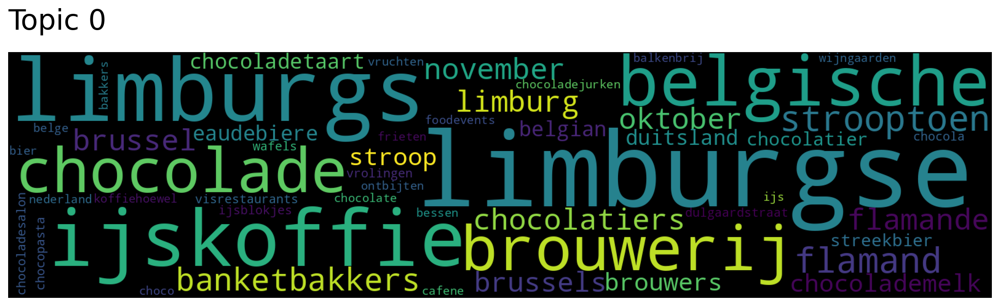

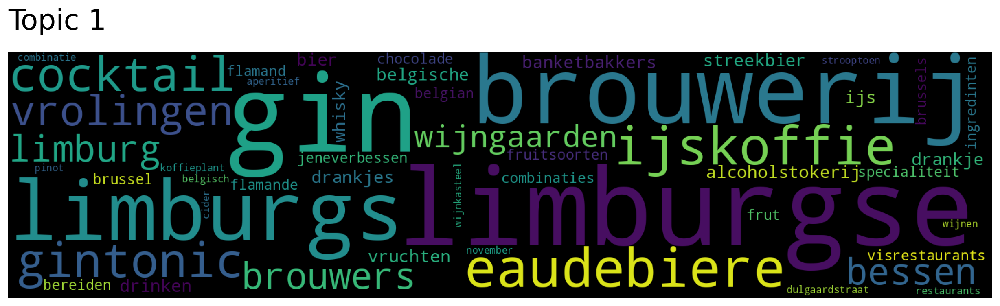

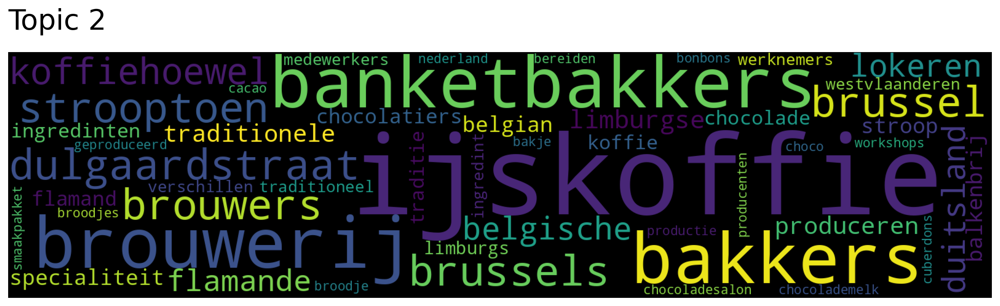

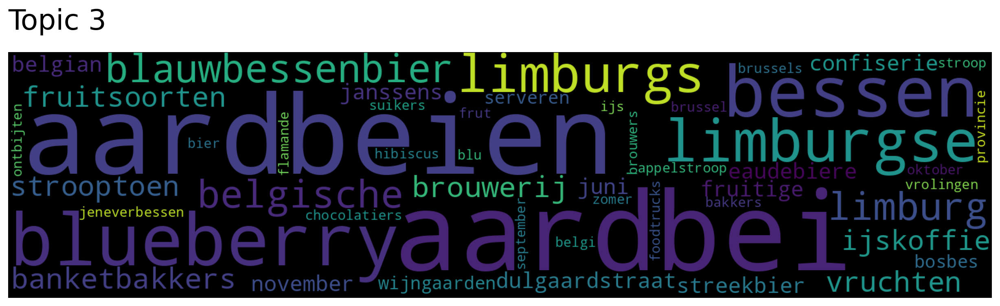

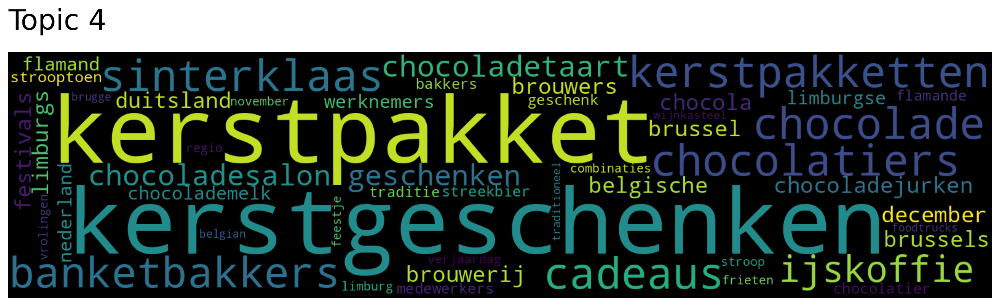

...

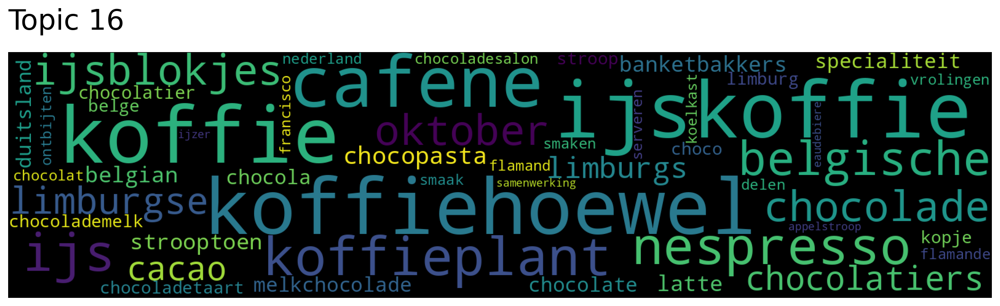

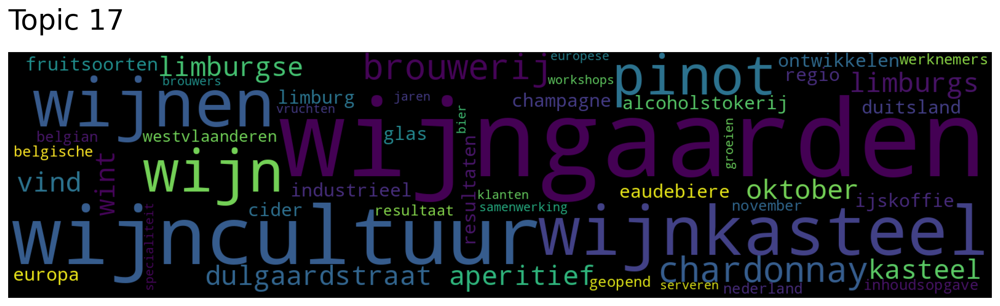

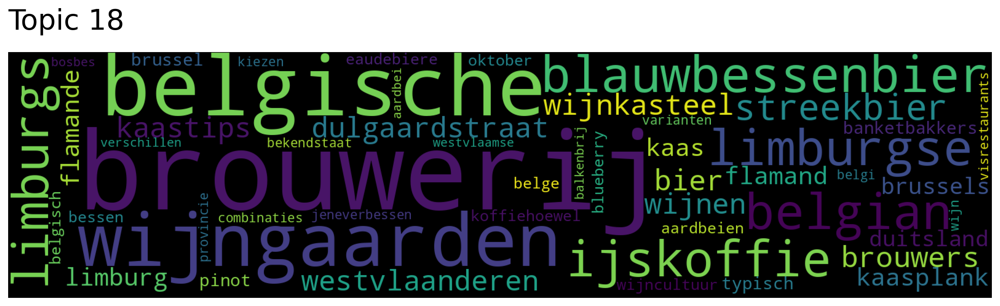

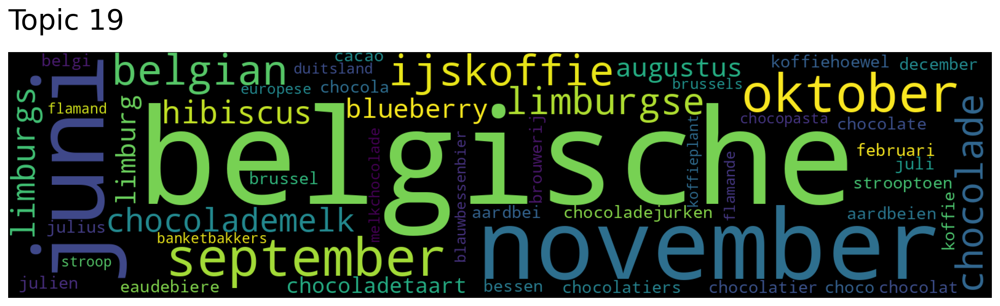

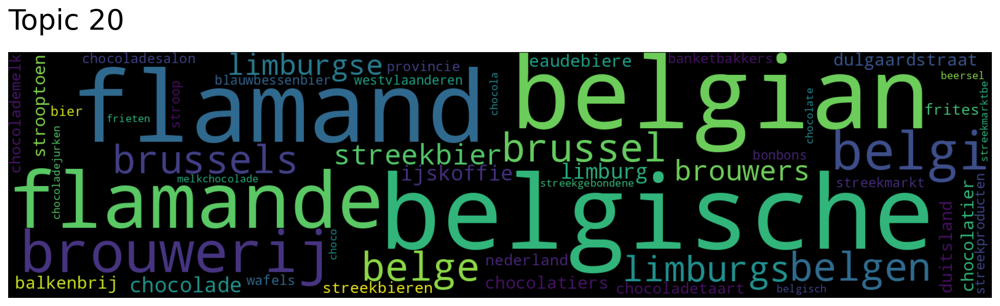

In [37]:
# saving wordclouds
for num in range(top2Vec_model.get_num_topics()):
    top2Vec_model.generate_topic_wordcloud(num).savefig(f'{num}.jpg')

In [38]:
top2Vec_model.search_documents_by_topic(topic_num=3, num_docs=5)

(array(['aardbei geschenken smaakpakketten win video tijdelijke deals pomona stroop online bestellen proef marbi choco blog contact webshop geschenken smaakpakketten win video tijdelijke deals pomona stroop online bestellen proef marbi choco blog contact webshop aardbeihome aardbei berichten over aardbei vanillewafeltjes met aardbeien van hoogstraten vanillewafeltjes met aardbeien van hoogstraten zoete aardbeienlasagne zoete aardbeienlasagne de beste aardbeien komen uit hoogstraten de beste aardbeien komen uit hoogstraten aardbeien gezond en lekker aardbeien gezond en lekker streekmarktfoodbelgium dulgaardstraat bilzen infostreekmarktbe ondernemingsnummer be btw nummer be webshop blu blauwbessenbier blog picknick aardbei producent in de kijker limburg gin belgische speculaas blauwe bessen chocolade cuberdon foodevents food festivals gentse waterzooi geschenken oostvlaanderen honing koffie streekbier stroop vleeswaren vlierbloesem west vlaanderen ham nieuws antwerpen gember nougat asper

In [39]:
words, word_scores = top2Vec_model.similar_words(keywords=["workshop"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

atelier 0.9182779765386776
workshops 0.9150455498204368
werknemer 0.7118603419008348
werk 0.7112056915479248
werken 0.7059365408177639
werkt 0.6545542077961553
werknemers 0.6268819068075479
doen 0.626535039373961
verwerkt 0.6230293338308515
werkgever 0.6031918028734334
wisten 0.5925729591274187
podium 0.5871450973688622
artisanale 0.5810611265367256
maken 0.5780958621493762
studie 0.5769597343782906
winkel 0.5685212006561805
master 0.5635711027095014
uitentreu 0.5623432352822975
personeel 0.5611809785081474
brengen 0.5610916966396581


In [63]:
encodings = [s.split() for s in corpus]
# words = []
# for s in encodings:
#     for word in s:
#         words.append(word)

# for word in words:
#     print(word)
#     word = word.replace(",", "")
#     word = word.replace("?", "")
#     word = word.replace("!", "")
#     word = word.replace(".", "")
# words[0]
w2vModel = gensim.models.Word2Vec(
        encodings,
        vector_size=150,
        window=10,
        min_count=2,
        workers=10,
        epochs=10)
w2vModel.save("streekproduct.be.word2vec.model")
# encodings[0]


In [69]:
w1 = ["wijn", "is"]
predictions = w2vModel.predict_output_word(w1)
for prediction in predictions:
    print(predictions)

[('kaneel', 0.0071065747), ('meer', 0.005335807), ('wijn', 0.0041451575), ('tegen', 0.0029481251), ('helpt', 0.0022686666), ('tonic', 0.001930053), ('foodtruck', 0.0015609304), ('smaak', 0.0014771923), ('rode', 0.0012576396), ('bier', 0.001218603)]
[('kaneel', 0.0071065747), ('meer', 0.005335807), ('wijn', 0.0041451575), ('tegen', 0.0029481251), ('helpt', 0.0022686666), ('tonic', 0.001930053), ('foodtruck', 0.0015609304), ('smaak', 0.0014771923), ('rode', 0.0012576396), ('bier', 0.001218603)]
[('kaneel', 0.0071065747), ('meer', 0.005335807), ('wijn', 0.0041451575), ('tegen', 0.0029481251), ('helpt', 0.0022686666), ('tonic', 0.001930053), ('foodtruck', 0.0015609304), ('smaak', 0.0014771923), ('rode', 0.0012576396), ('bier', 0.001218603)]
[('kaneel', 0.0071065747), ('meer', 0.005335807), ('wijn', 0.0041451575), ('tegen', 0.0029481251), ('helpt', 0.0022686666), ('tonic', 0.001930053), ('foodtruck', 0.0015609304), ('smaak', 0.0014771923), ('rode', 0.0012576396), ('bier', 0.001218603)]
[('k